XG Boosting to handle class imbalance

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
test = pd.read_csv('test.csv')
train = pd.read_csv('train.csv')



In [ ]:
train.columns

Index(['AccountAge', 'MonthlyCharges', 'TotalCharges', 'SubscriptionType',
       'PaymentMethod', 'PaperlessBilling', 'ContentType', 'MultiDeviceAccess',
       'DeviceRegistered', 'ViewingHoursPerWeek', 'AverageViewingDuration',
       'ContentDownloadsPerMonth', 'GenrePreference', 'UserRating',
       'SupportTicketsPerMonth', 'Gender', 'WatchlistSize', 'ParentalControl',
       'SubtitlesEnabled', 'CustomerID', 'Churn'],
      dtype='object')

In [ ]:
#checking for NA values
train.isna().sum()

,0
AccountAge,0
MonthlyCharges,0
TotalCharges,0
SubscriptionType,0
PaymentMethod,0
PaperlessBilling,0
ContentType,0
MultiDeviceAccess,0
DeviceRegistered,0
ViewingHoursPerWeek,0


##Feature Mapping

| Feature               | Category         | Code |
| --------------------- | ---------------- | :--: |
| **Gender**            | Male             |   0  |
|                       | Female           |   1  |
| **SubscriptionType**  | Basic            |   0  |
|                       | Standard         |   1  |
|                       | Premium          |   2  |
| **ContentType**       | Movies           |   0  |
|                       | TV Shows         |   1  |
|                       | Both             |   2  |
| **GenrePreference**   | Comedy           |   0  |
|                       | Fantasy          |   1  |
|                       | Drama            |   2  |
|                       | Action           |   3  |
|                       | Sci-Fi           |   4  |
| **PaymentMethod**     | Electronic check |   0  |
|                       | Credit card      |   1  |
|                       | Bank transfer    |   2  |
|                       | Mailed check     |   3  |
| **PaperlessBilling**  | Yes              |   0  |
|                       | No               |   1  |
| **MultiDeviceAccess** | Yes              |   0  |
|                       | No               |   1  |
| **DeviceRegistered**  | Computer         |   0  |
|                       | Tablet           |   1  |
|                       | Mobile           |   2  |
|                       | TV               |   3  |
| **ParentalControl**   | Yes              |   0  |
|                       | No               |      |


In [ ]:
train

,AccountAge,MonthlyCharges,TotalCharges,SubscriptionType,PaymentMethod,PaperlessBilling,ContentType,MultiDeviceAccess,DeviceRegistered,ViewingHoursPerWeek,...,ContentDownloadsPerMonth,GenrePreference,UserRating,SupportTicketsPerMonth,Gender,WatchlistSize,ParentalControl,SubtitlesEnabled,CustomerID,Churn
0,20,11.055215,221.104302,Premium,Mailed check,No,Both,No,Mobile,36.758104,...,10,Sci-Fi,2.176498,4,Male,3,No,No,CB6SXPNVZA,0
1,57,5.175208,294.986882,Basic,Credit card,Yes,Movies,No,Tablet,32.450568,...,18,Action,3.478632,8,Male,23,No,Yes,S7R2G87O09,0
2,73,12.106657,883.785952,Basic,Mailed check,Yes,Movies,No,Computer,7.395160,...,23,Fantasy,4.238824,6,Male,1,Yes,Yes,EASDC20BDT,0
3,32,7.263743,232.439774,Basic,Electronic check,No,TV Shows,No,Tablet,27.960389,...,30,Drama,4.276013,2,Male,24,Yes,Yes,NPF69NT69N,0
4,57,16.953078,966.325422,Premium,Electronic check,Yes,TV Shows,No,TV,20.083397,...,20,Comedy,3.616170,4,Female,0,No,No,4LGYPK7VOL,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243782,77,9.639902,742.272460,Basic,Mailed check,No,Movies,No,Computer,13.502729,...,47,Sci-Fi,3.697451,1,Male,8,Yes,No,FBZ38J108Z,0
243783,117,13.049257,1526.763053,Premium,Credit card,No,TV Shows,Yes,TV,24.963291,...,35,Comedy,1.449742,4,Male,20,No,No,W4AO1Y6NAI,0
243784,113,14.514569,1640.146267,Premium,Credit card,Yes,TV Shows,No,TV,10.628728,...,44,Action,4.012217,6,Male,13,Yes,Yes,0H3SWWI7IU,0
243785,7,18.140555,126.983887,Premium,Bank transfer,Yes,TV Shows,No,TV,30.466782,...,36,Fantasy,2.135789,7,Female,5,No,Yes,63SJ44RT4A,0


In [ ]:
train['DeviceRegistered'].value_counts()

,count
DeviceRegistered,
Computer,61147
Tablet,61143
Mobile,60914
TV,60583


In [ ]:
# ensure numeric columns are ints
train['ViewingHoursPerWeek'] = train['ViewingHoursPerWeek'].astype(int)
train['MonthlyCharges']         = train['MonthlyCharges'].astype(int)
train['TotalCharges']           = train['TotalCharges'].astype(int)
train['UserRating']             = train['UserRating'].astype(int)

# binary / ordinal maps
train['Gender']           = train['Gender'].map({'Male': 0, 'Female': 1})
train['SubscriptionType'] = train['SubscriptionType'].map({'Basic': 0, 'Standard': 1, 'Premium': 2})
train['ContentType']      = train['ContentType'].map({'Movies': 0, 'TV Shows': 1, 'Both': 2})
train['GenrePreference']  = train['GenrePreference'].map({
    'Comedy': 0, 'Fantasy': 1, 'Drama': 2, 'Action': 3, 'Sci-Fi': 4
})
train['PaymentMethod']    = train['PaymentMethod'].map({
    'Electronic check': 0,
    'Credit card':      1,
    'Bank transfer':    2,
    'Mailed check':     3
})
train['PaperlessBilling']   = train['PaperlessBilling'].map({'Yes': 0, 'No': 1})
train['MultiDeviceAccess']  = train['MultiDeviceAccess'].map({'Yes': 0, 'No': 1})
train['DeviceRegistered']   = train['DeviceRegistered'].map({
    'Computer': 0,
    'Tablet':   1,
    'Mobile':   2,
    'TV':       3
})
train['ParentalControl']    = train['ParentalControl'].map({'Yes': 0, 'No': 1})
train['SubtitlesEnabled']   = train['SubtitlesEnabled'].map({'Yes': 0, 'No': 1})

# derived features
train['AvgMonthlyCharges']     = (train['TotalCharges'] / train['AccountAge']).fillna(0).astype(int)
train['EngagementScore']       = (train['ContentDownloadsPerMonth'] * train['ViewingHoursPerWeek']).astype(int)
train['TicketsPerMonthTenure'] = (
    train['SupportTicketsPerMonth'] / train['AccountAge']
).fillna(0).astype(int)


Heatmap correlation to observe any linear relations


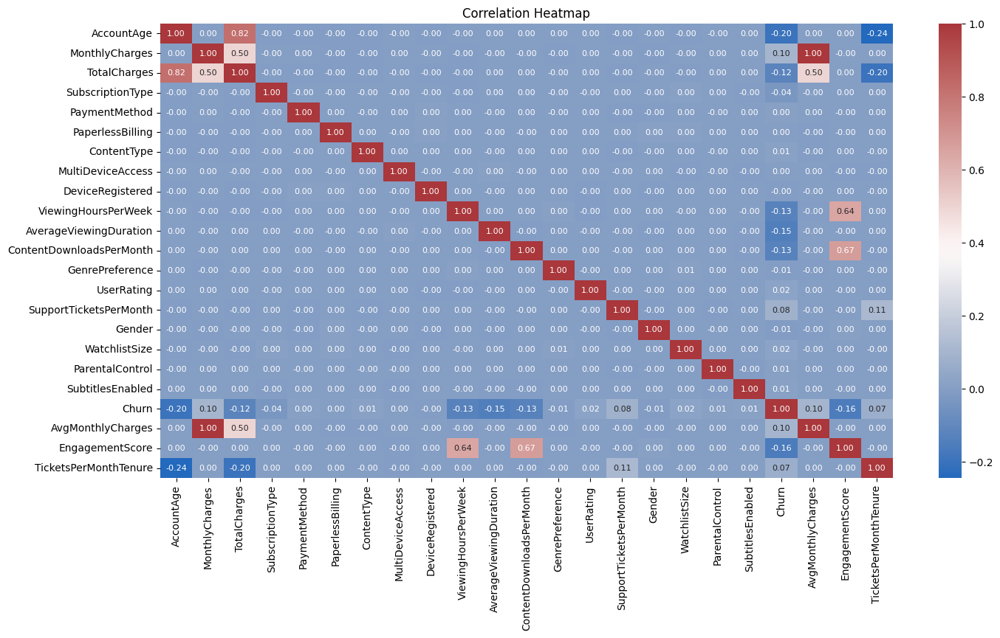

In [ ]:
train_ = train.drop(['CustomerID'], axis = 1)

plt.figure(figsize = (16, 8))
sns.heatmap(train_.corr(), annot =
            True, cmap = 'vlag', fmt = '.2f', annot_kws={"size":8})
plt.title('Correlation Heatmap')
plt.show()

Account Age

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


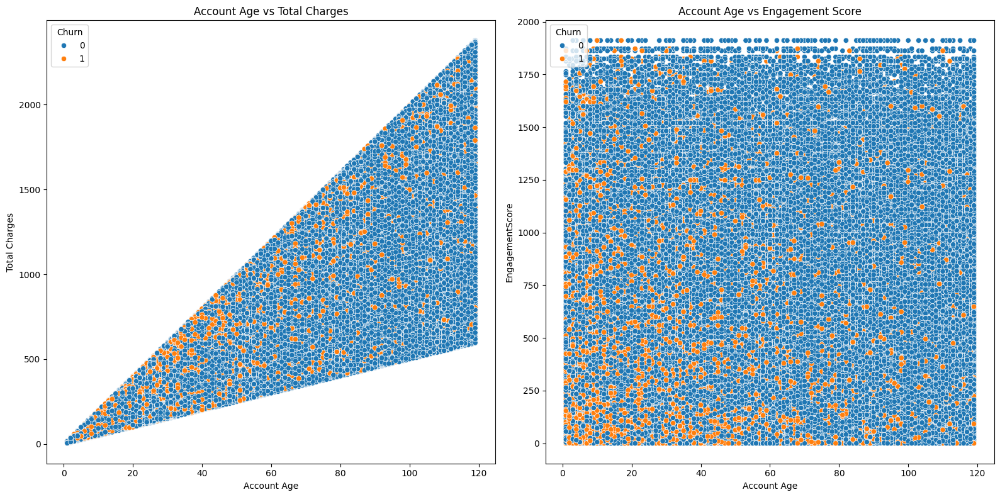

In [ ]:
#Account Age vs Total Charges
#Account Age vs Tickets Per Month Tenure

fig, axes = plt.subplots(1, 2, figsize = (16, 8))

sns.scatterplot(x = train['AccountAge'], y = train['TotalCharges'], hue = train['Churn'],ax = axes[0])
axes[0].set_title('Account Age vs Total Charges')
axes[0].set_xlabel('Account Age')
axes[0].set_ylabel('Total Charges')

sns.scatterplot(x = train['AccountAge'], y = train['EngagementScore'] , hue=train['Churn'], ax = axes[1])
axes[1].set_title('Account Age vs Engagement Score')
axes[1].set_xlabel('Account Age')
axes[1].set_ylabel('EngagementScore')

plt.tight_layout()
plt.show()


# Graph Left

Account Age vs Total Charges
the pattern of the graph forms a triangular shape thus showing that as the age of the account increases, so do the total charges. A clear bound is formed depicting that the range of total charges between customers also increases as the accounts age. Though there is a spread of churned users throughout the entire triangle, we do observe a chunkier amount of churn for users with younger accounts but higher charges. But this observation becomes more uniform as the accounts' age increases.

In conclusion Tenure and Spending alone are not good indicators of churn.

# Graph Right

Account Age vs Engagement Score
This graph is more scattered and dense, suggesting no clear linear correlation between Account Age and Engagement Score. The churn's distribution is scattered but there is a greater density of churned user for accounts that are younger and have lower engagement scores. From the above graph a relationship can be established that is nonlinear and more cluster based.


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


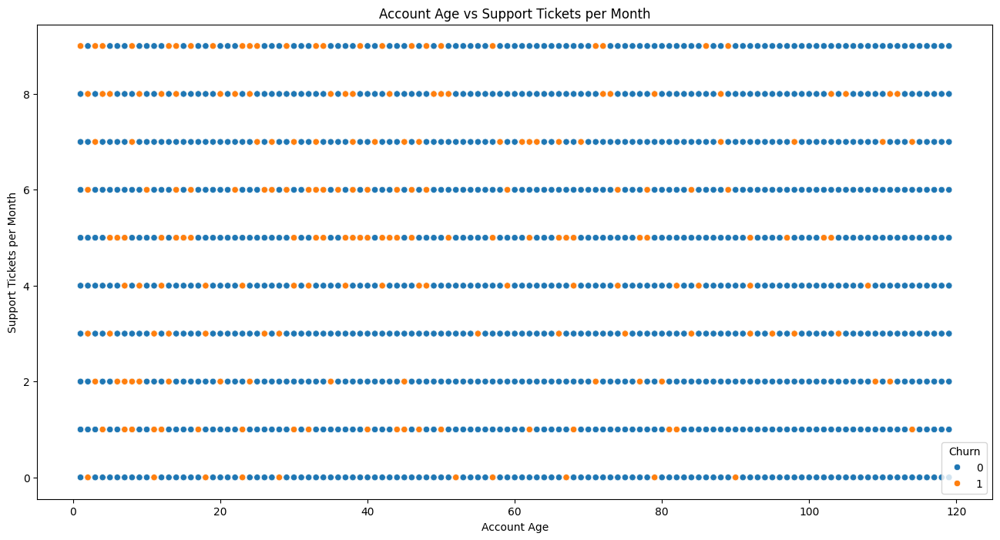

In [ ]:
plt.figure(figsize = (16, 8))
sns.scatterplot(x = train['AccountAge'],  y = train['SupportTicketsPerMonth'], hue = train['Churn'])
plt.title('Account Age vs Support Tickets per Month')
plt.xlabel('Account Age')
plt.ylabel('Support Tickets per Month')
plt.show()

Account Age vs Support Tickets per Month

There is no strong pattern showing that new accounts submit more support tickets or less or conversely, older accounts submitting more or less tickets. Churned users appear across all numbers of support tickets per month, showing no clear indication of the number of support tickets influencing churn strongly. There does appear to be a slightly larger number of churned user between 4 and 6 support
tickets per month but it is not an overwhelming amount.

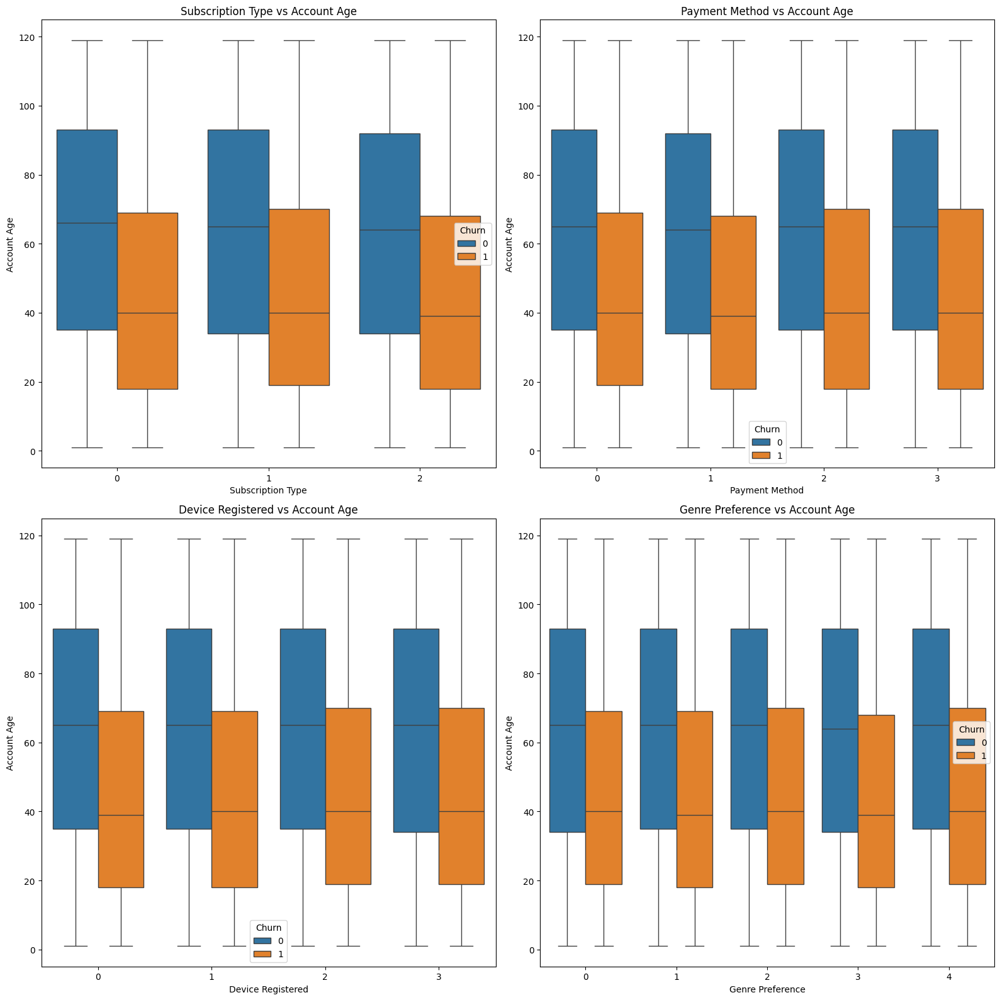

In [ ]:
#subscription type, patment method, devices registered, genre  vs Account age

fig, axes = plt.subplots(2, 2, figsize = (16, 16))

sns.boxplot(x = train['SubscriptionType'], y = train['AccountAge'], hue = train['Churn'], ax = axes[0, 0])
axes[0, 0].set_title('Subscription Type vs Account Age')
axes[0, 0].set_xlabel('Subscription Type')
axes[0, 0].set_ylabel('Account Age')

sns.boxplot(x = train['PaymentMethod'], y = train['AccountAge'], hue = train['Churn'], ax = axes[0, 1])
axes[0, 1].set_title('Payment Method vs Account Age')
axes[0, 1].set_xlabel('Payment Method')
axes[0, 1].set_ylabel('Account Age')

sns.boxplot(x = train['DeviceRegistered'], y = train['AccountAge'], hue = train['Churn'], ax = axes[1, 0])
axes[1, 0].set_title('Device Registered vs Account Age')
axes[1, 0].set_xlabel('Device Registered')
axes[1, 0].set_ylabel('Account Age')

sns.boxplot(x = train['GenrePreference'], y = train['AccountAge'], hue = train['Churn'], ax = axes[1, 1])
axes[1, 1].set_title('Genre Preference vs Account Age')
axes[1, 1].set_xlabel('Genre Preference')
axes[1, 1].set_ylabel('Account Age')

plt.tight_layout()
plt.show()

### Subscription Type
Across all types, churned users have lower account ages suggesting that churn occurs regarless of subscription type. Retained users have a higher median likely due to continued use of the service.

### Payment Method

Payment method does not appear to affect churn and retention

### Device Registered

A similar observation is deduced with the devices registered.

### Genre Preference

Again churn appears to be independent of the genre preference of users

The key takeaway from these plots is that most churn occurs for accounts between the ages of 20 to 60 months with the median being at 40.

### Next steps

Segmented analysis of each feature and breaking down the observation in groups based on attributes such as Subtitles Enabled, Parental Control Enablement and Gender.



Total Charges

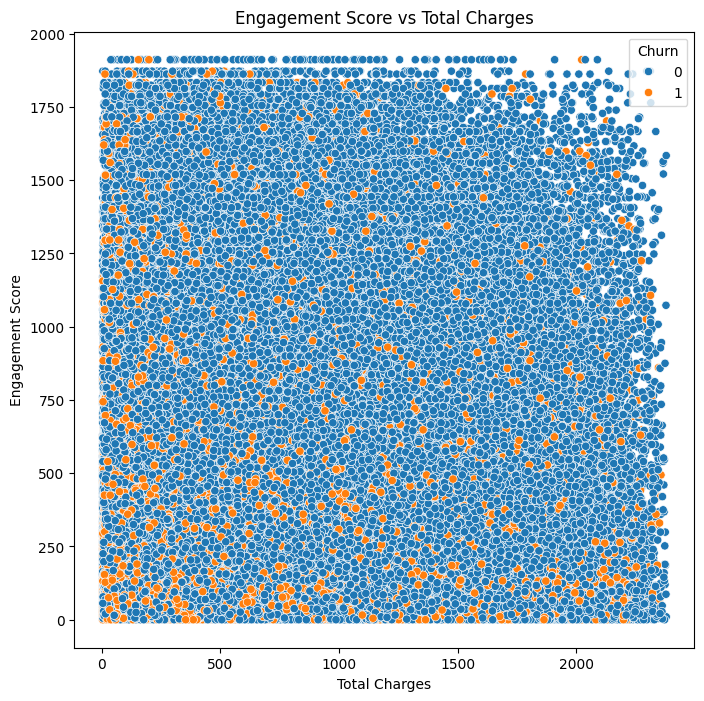

In [ ]:
plt.figure(figsize = (8, 8))
sns.scatterplot(x = train['TotalCharges'], y = train['EngagementScore'], hue = train['Churn'])
plt.title('Engagement Score vs Total Charges')
plt.xlabel('Total Charges')
plt.ylabel('Engagement Score')
plt.show()

#### Engagement Score vs Total Charges

In the bottom left of the graph where the engagement is less than 500 and the total monthly charges are also less than 500, churn is most concentrated. Churn becomes less at higher engagements but there are still sparsed cases of churn but they are towards the lower end of the total charges.


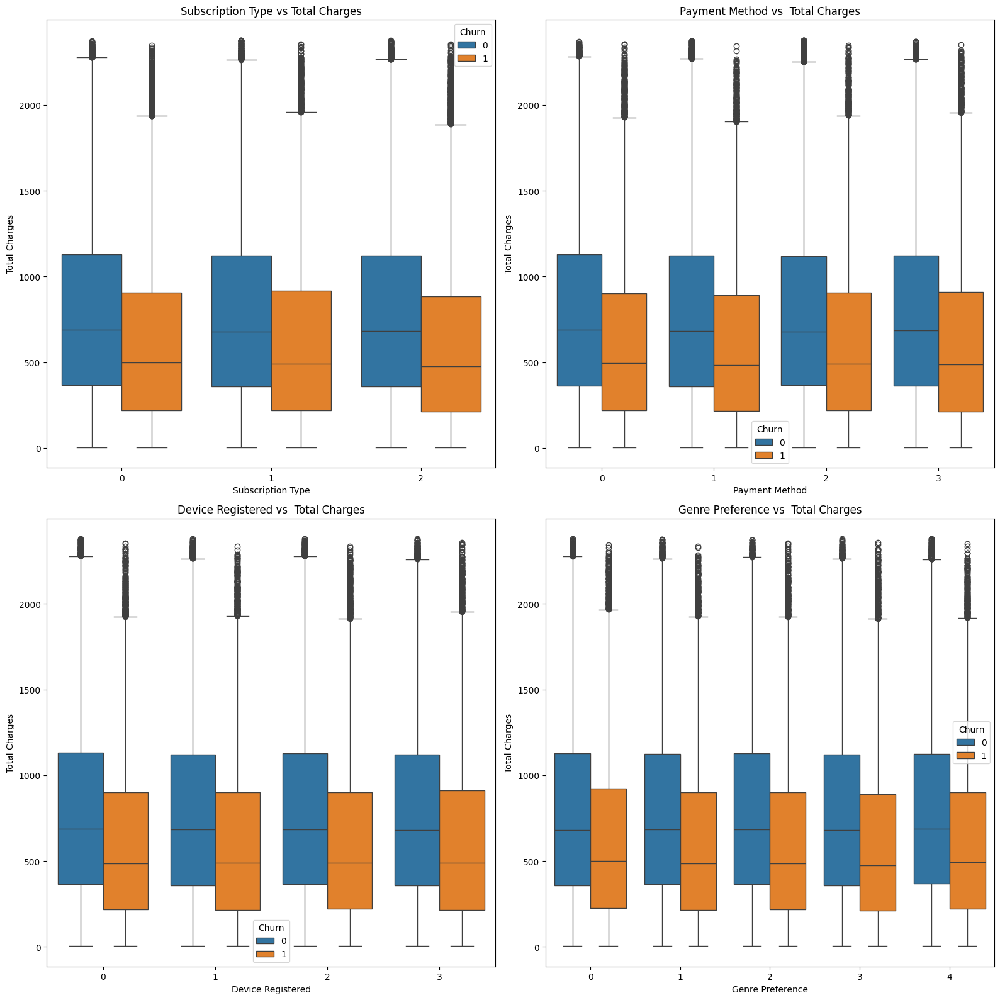

In [ ]:
#subscription type, patment method, devices registered, genre preferences vs total charges

fig, axes = plt.subplots(2, 2, figsize = (16, 16))

sns.boxplot(x = train['SubscriptionType'], y = train['TotalCharges'], hue = train['Churn'], ax = axes[0, 0])
axes[0, 0].set_title('Subscription Type vs Total Charges')
axes[0, 0].set_xlabel('Subscription Type')
axes[0, 0].set_ylabel('Total Charges')

sns.boxplot(x = train['PaymentMethod'], y = train['TotalCharges'], hue = train['Churn'], ax = axes[0, 1])
axes[0, 1].set_title('Payment Method vs  Total Charges')
axes[0, 1].set_xlabel('Payment Method')
axes[0, 1].set_ylabel('Total Charges')

sns.boxplot(x = train['DeviceRegistered'], y = train['TotalCharges'], hue = train['Churn'], ax = axes[1, 0])
axes[1, 0].set_title('Device Registered vs  Total Charges')
axes[1, 0].set_xlabel('Device Registered')
axes[1, 0].set_ylabel('Total Charges')

sns.boxplot(x = train['GenrePreference'], y = train['TotalCharges'], hue = train['Churn'], ax = axes[1, 1])
axes[1, 1].set_title('Genre Preference vs  Total Charges')
axes[1, 1].set_xlabel('Genre Preference')
axes[1, 1].set_ylabel('Total Charges')

plt.tight_layout()
plt.show()

The above graphs depict that churned users tend to have a lower amount of monthly charges irrespective of the categorical features - subscription type, devices registered, payment method and genre preference.

Perhaps using the average monthly charges would show variation between the different attributes.

Viewing Hours Per Week

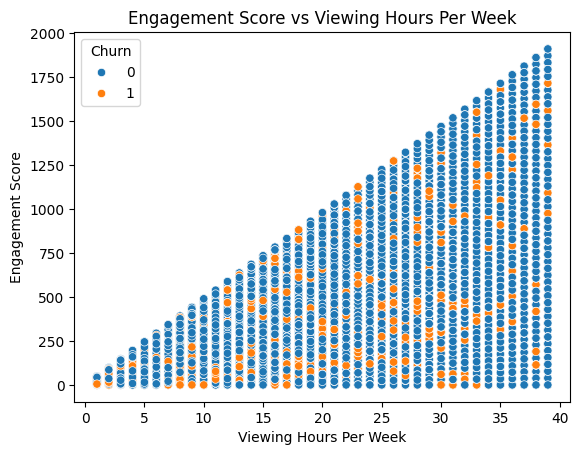

In [ ]:
#Veiwing hours per week
sns.scatterplot(x = train['ViewingHoursPerWeek'], y = train['EngagementScore'], hue = train['Churn'])
plt.title('Engagement Score vs Viewing Hours Per Week')
plt.xlabel('Viewing Hours Per Week')
plt.ylabel('Engagement Score')
plt.show()


The above graph shows a linear relationship between viewing hours per week and the engagement score but it does not depict a clear boundary between churned and not churned users. Though we do see a larger density of churn between 20 and 35 viewing hours per week with engagement between 0 and 500, there are still many cases outside of this region of the graph.

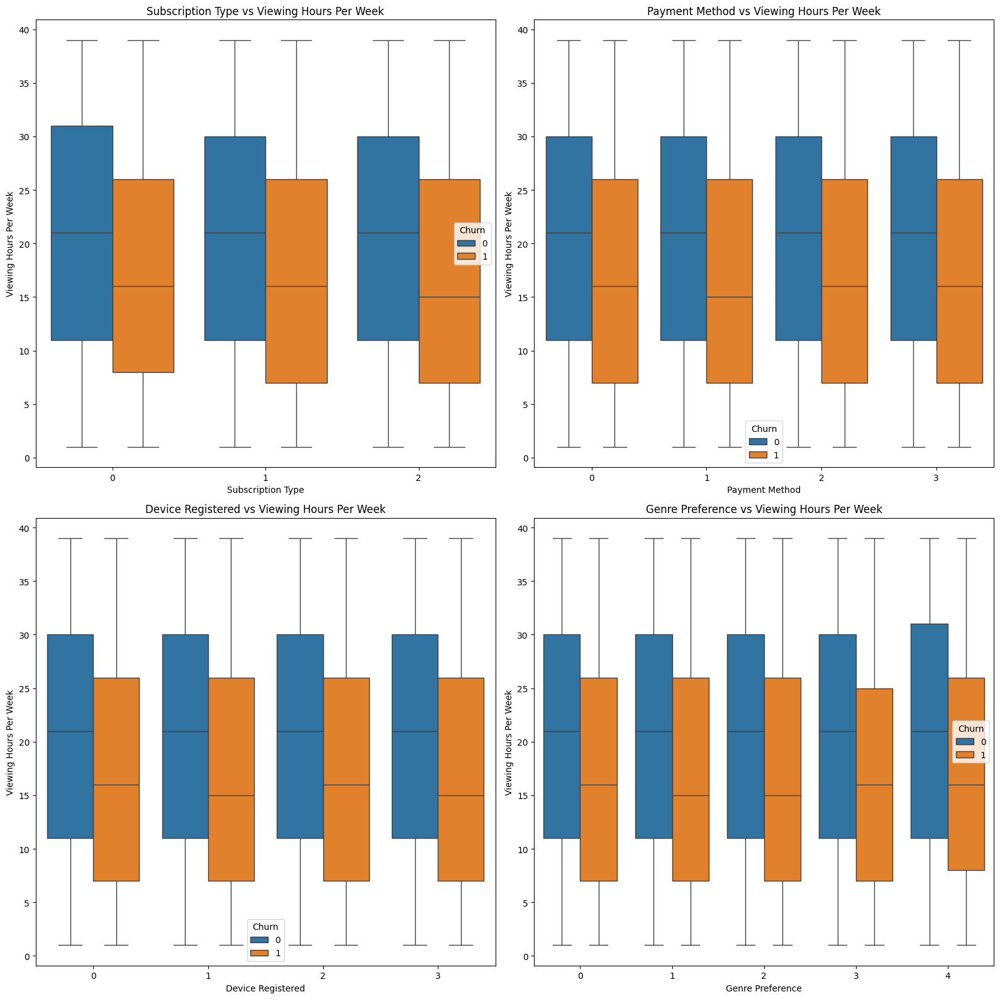

In [ ]:
#subscription type, patment method, devices registered, genre preferences against Viewing Hours Per Week

fig, axes = plt.subplots(2, 2, figsize = (16, 16))

sns.boxplot(x = train['SubscriptionType'], y = train['ViewingHoursPerWeek'], hue = train['Churn'], ax = axes[0, 0])
axes[0, 0].set_title('Subscription Type vs Viewing Hours Per Week')
axes[0, 0].set_xlabel('Subscription Type')
axes[0, 0].set_ylabel('Viewing Hours Per Week')

sns.boxplot(x = train['PaymentMethod'], y = train['ViewingHoursPerWeek'], hue = train['Churn'], ax = axes[0, 1])
axes[0, 1].set_title('Payment Method vs Viewing Hours Per Week')
axes[0, 1].set_xlabel('Payment Method')
axes[0, 1].set_ylabel('Viewing Hours Per Week')

sns.boxplot(x = train['DeviceRegistered'], y = train['ViewingHoursPerWeek'], hue = train['Churn'], ax = axes[1, 0])
axes[1, 0].set_title('Device Registered vs Viewing Hours Per Week')
axes[1, 0].set_xlabel('Device Registered')
axes[1, 0].set_ylabel('Viewing Hours Per Week')

sns.boxplot(x = train['GenrePreference'], y = train['ViewingHoursPerWeek'], hue = train['Churn'], ax = axes[1, 1])
axes[1, 1].set_title('Genre Preference vs Viewing Hours Per Week')
axes[1, 1].set_xlabel('Genre Preference')
axes[1, 1].set_ylabel('Viewing Hours Per Week')

plt.tight_layout()
plt.show()

The churn across all categorical features appears to be relatively uniform with minute variances across the attributes with respect to viewing hours per week. If you look closely there are slightly higher and lower median viewing hours per week for the churned users

Average Viewing Duration

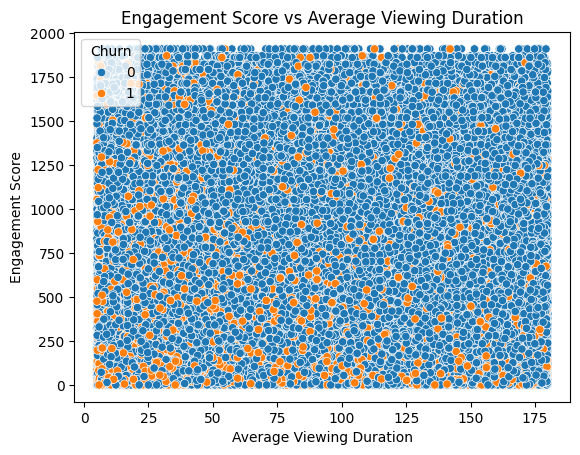

In [ ]:
sns.scatterplot(x = train['AverageViewingDuration'], y = train['EngagementScore'], hue = train['Churn'])
plt.title('Engagement Score vs Average Viewing Duration')
plt.xlabel('Average Viewing Duration')
plt.ylabel('Engagement Score')
plt.show()

The above graph depicts a similar relationship that all other numerical features plotted against the engagement score depcit; a higher concentration of churn towards the bottom left quadrant of the graph.

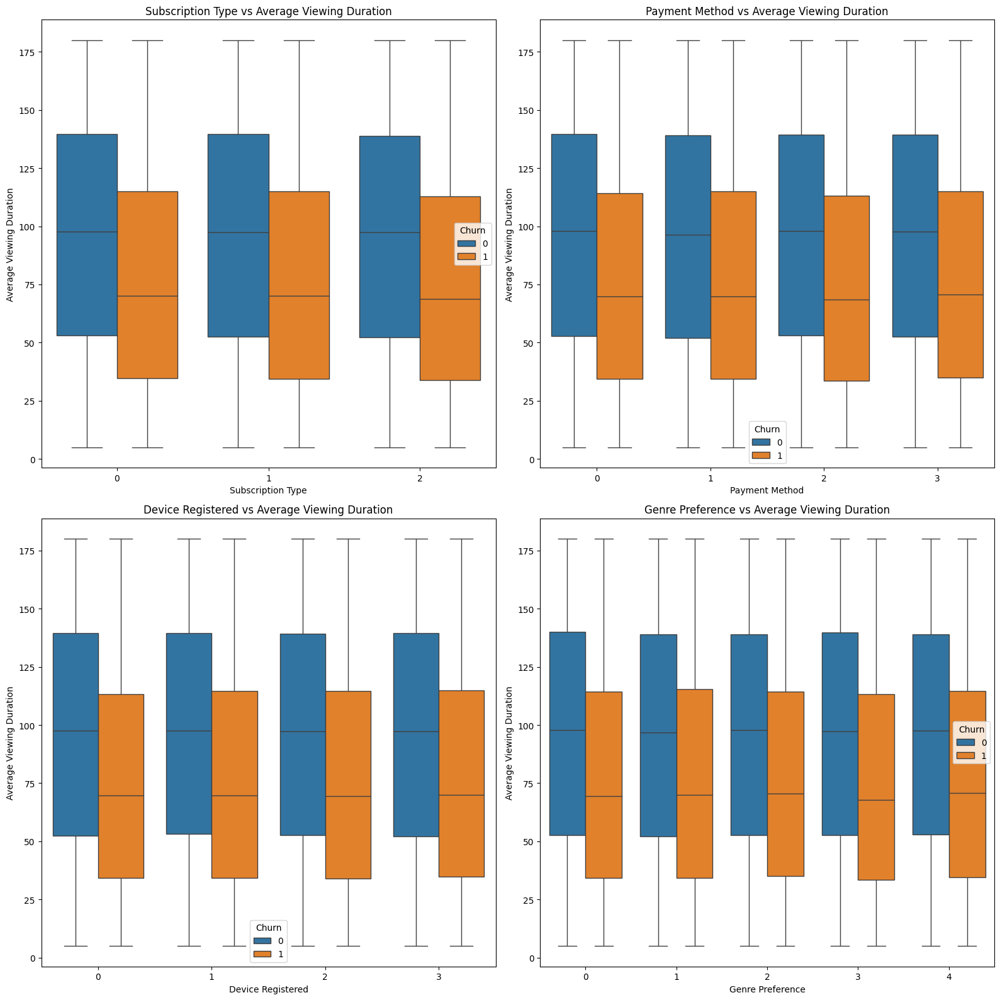

In [ ]:
#subscription type, patment method, devices registered, genre preferences against Average viewing duration

fig, axes = plt.subplots(2, 2, figsize = (16, 16))

sns.boxplot(x = train['SubscriptionType'], y = train['AverageViewingDuration'], hue = train['Churn'], ax = axes[0, 0])
axes[0, 0].set_title('Subscription Type vs Average Viewing Duration')
axes[0, 0].set_xlabel('Subscription Type')
axes[0, 0].set_ylabel('Average Viewing Duration')

sns.boxplot(x = train['PaymentMethod'], y = train['AverageViewingDuration'], hue = train['Churn'], ax = axes[0, 1])
axes[0, 1].set_title('Payment Method vs Average Viewing Duration')
axes[0, 1].set_xlabel('Payment Method')
axes[0, 1].set_ylabel('Average Viewing Duration')

sns.boxplot(x = train['DeviceRegistered'], y = train['AverageViewingDuration'], hue = train['Churn'], ax = axes[1, 0])
axes[1, 0].set_title('Device Registered vs Average Viewing Duration')
axes[1, 0].set_xlabel('Device Registered')
axes[1, 0].set_ylabel('Average Viewing Duration')

sns.boxplot(x = train['GenrePreference'], y = train['AverageViewingDuration'], hue = train['Churn'], ax = axes[1, 1])
axes[1, 1].set_title('Genre Preference vs Average Viewing Duration')
axes[1, 1].set_xlabel('Genre Preference')
axes[1, 1].set_ylabel('Average Viewing Duration')

plt.tight_layout()
plt.show()

Content Downloads per Month

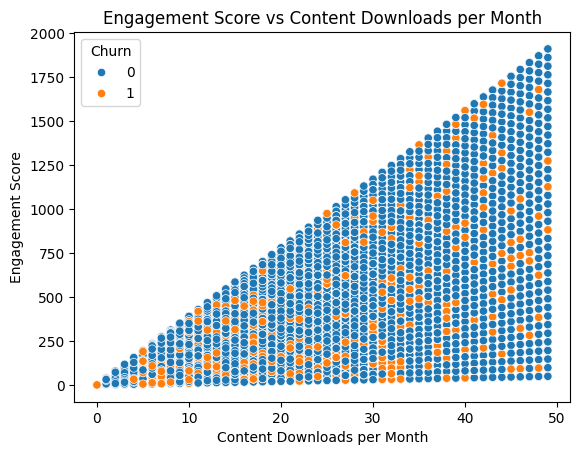

In [ ]:
sns.scatterplot(x = train['ContentDownloadsPerMonth'], y = train['EngagementScore'], hue = train['Churn'])
plt.title('Engagement Score vs Content Downloads per Month')
plt.xlabel('Content Downloads per Month')
plt.ylabel('Engagement Score')
plt.show()

The engagement score plotted against the content downloaded per month depicts an interesting plot. It assumes the shape of a triangle in which the range of the engagement score increases as the number of downloads per month increases.

There does appear to be a higher concentration of churn for when the content downloads per month is less than 20. There is still churn for higher values of content downloads per month hence depicting no strict boundary between the churn and not churned users.

The next segment of analysis will involve breaking the data down in terms of gender, subtitles enabled and parental control enablement to see if churned and not churned users can be separably distinguished.

In [ ]:
train['Gender']

,Gender
0,0
1,0
2,0
3,0
4,1
...,...
243782,0
243783,0
243784,0
243785,1


In [ ]:
#Gender 0 is male, 1 is female
train_male = train[train['Gender']==0]
train_female = train[train['Gender']==1]
#Parental Control 0 is yes, 1 is no
train_parental = train[train['ParentalControl']==0]
train_no_parental = train[train['ParentalControl']==1]
#Subtitles Enabled 0 is yes, 1 is no
train_subtitles = train[train['SubtitlesEnabled']==0]
train_no_subtitles = train[train['SubtitlesEnabled']==1]

data_arrays = [train_male, train_female, train_parental, train_no_parental, train_subtitles, train_no_subtitles]
titles = ['Male', 'Female', 'Parental Control', 'No Parental Control', 'Subtitles Enabled', 'No Subtitles Enabled']

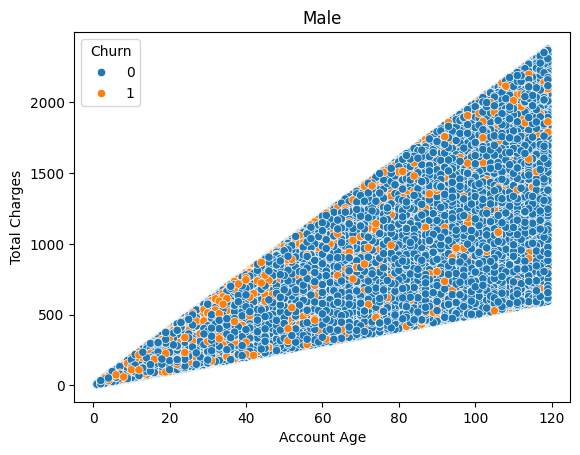

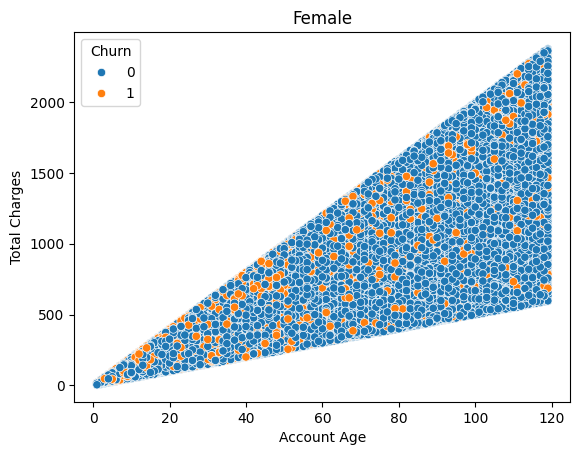

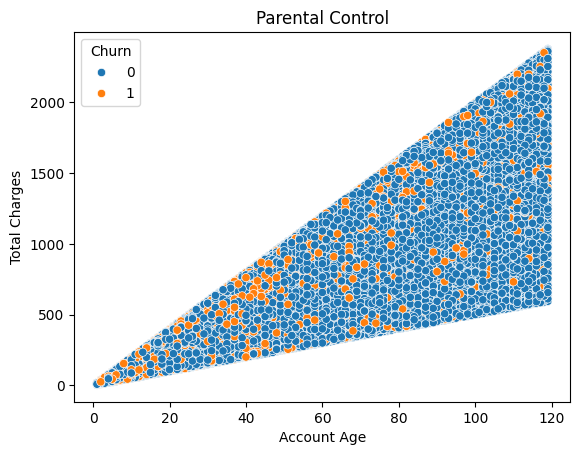

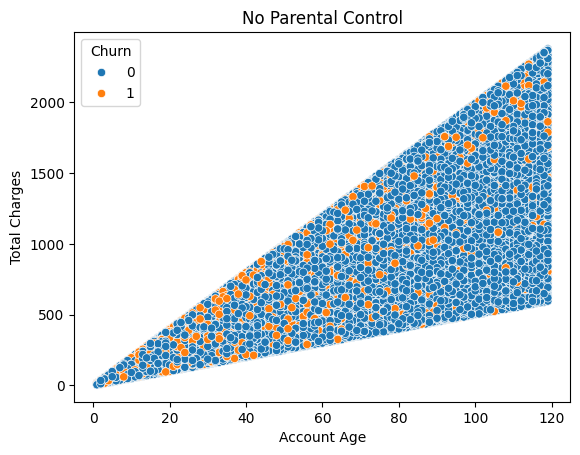

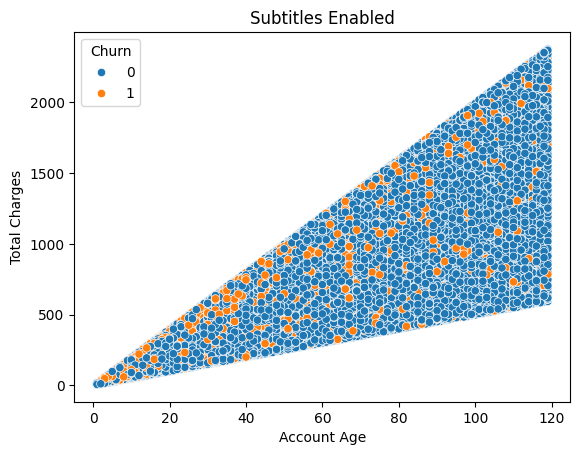

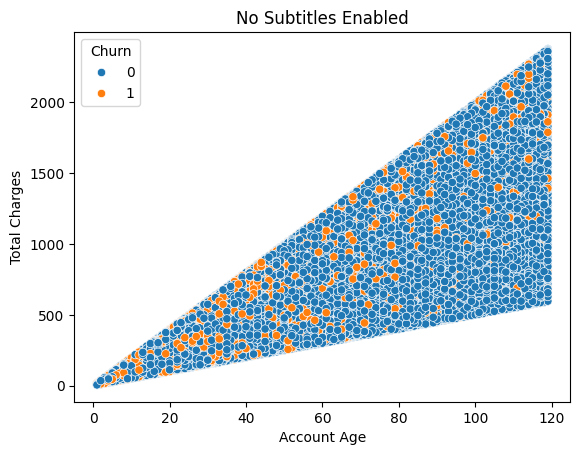

In [ ]:
for data, title in zip(data_arrays, titles):
  plt.figure()
  sns.scatterplot(x = data['AccountAge'], y = data['TotalCharges'], hue = data['Churn'])
  plt.xlabel('Account Age')
  plt.ylabel('Total Charges')
  plt.title(title)
  plt.show

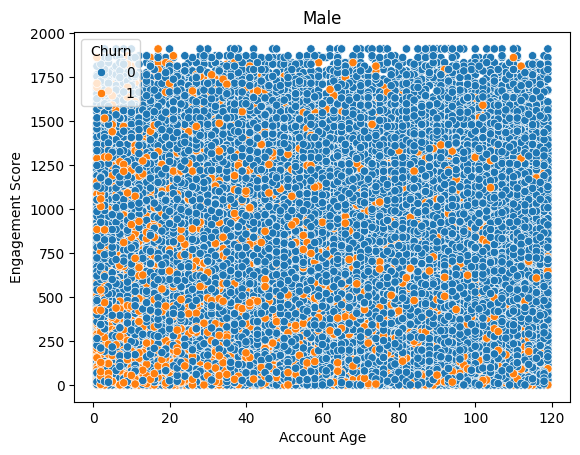

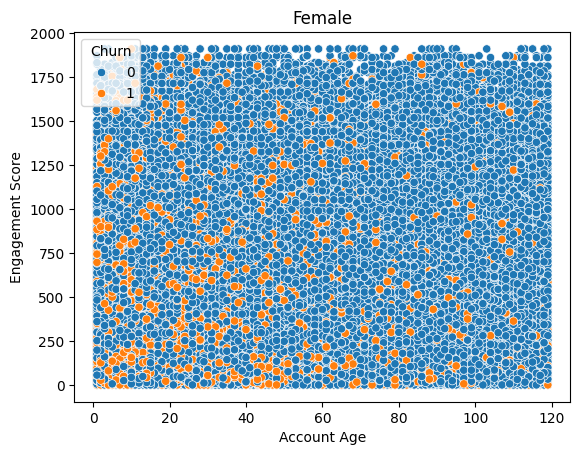

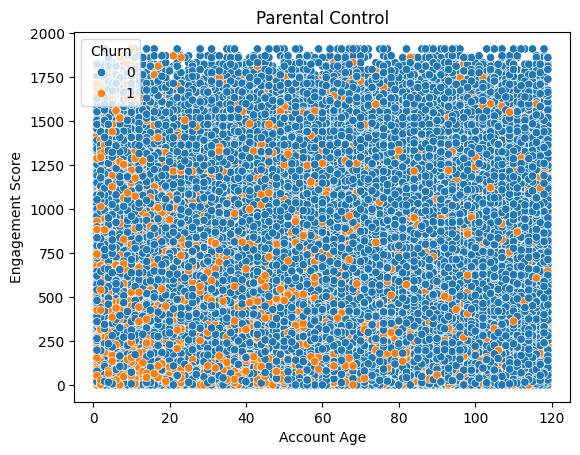

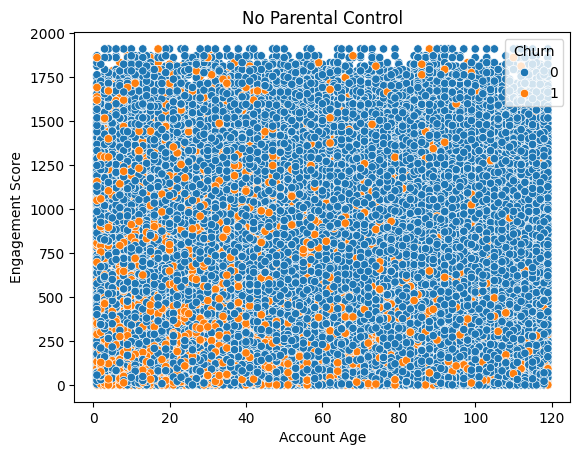

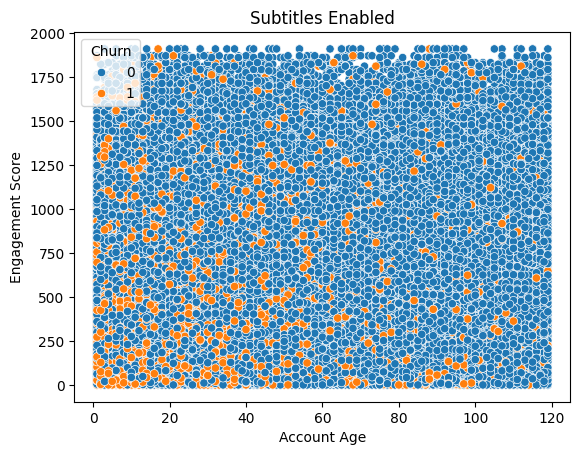

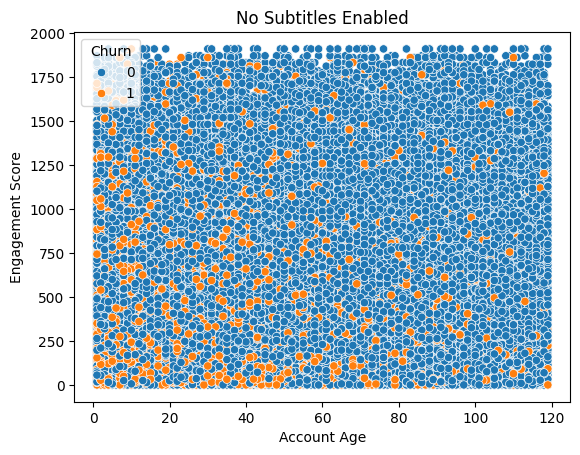

In [ ]:
for data, title in zip(data_arrays, titles):
  plt.figure()
  sns.scatterplot(x = data['AccountAge'], y = data['EngagementScore'], hue = data['Churn'])
  plt.xlabel('Account Age')
  plt.ylabel('Engagement Score')
  plt.title(title)
  plt.show

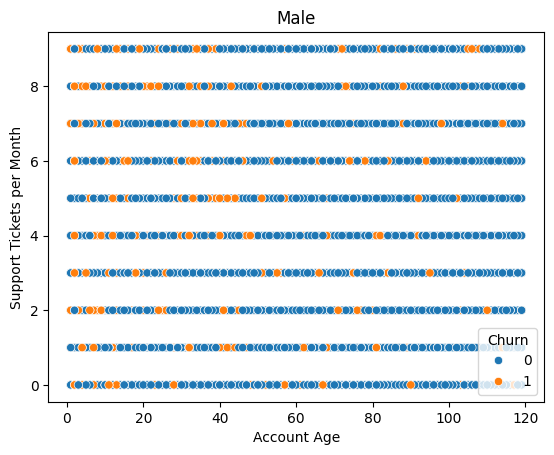

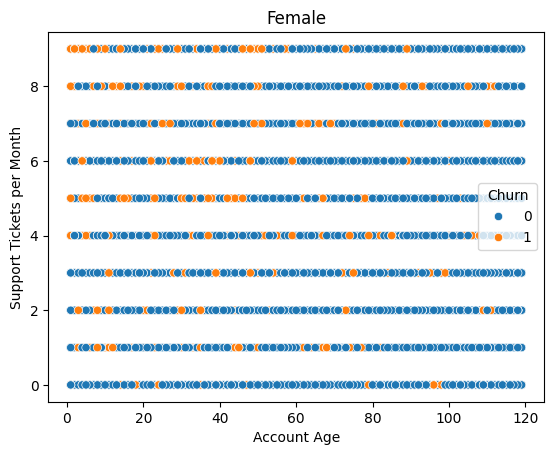

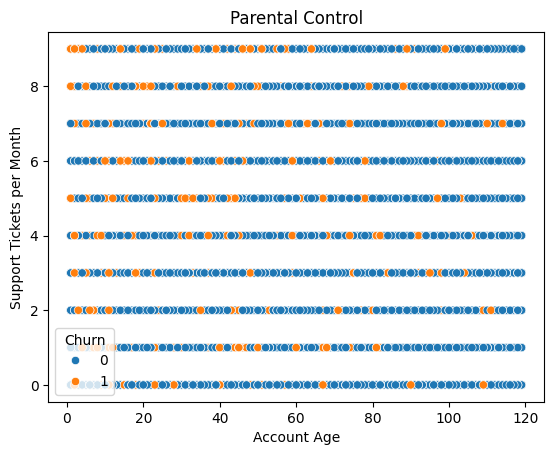

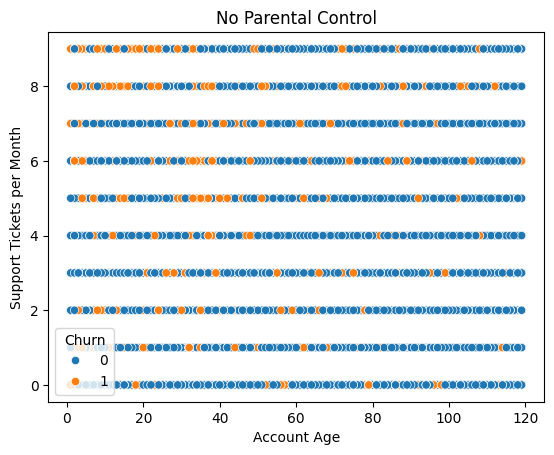

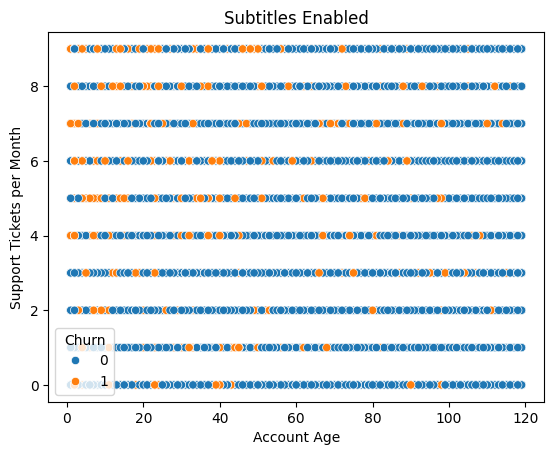

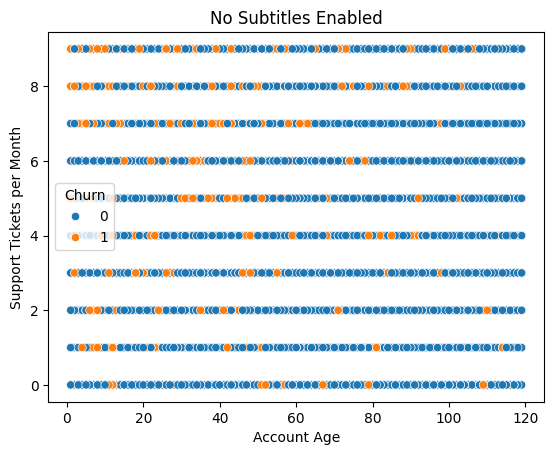

In [ ]:
for title, data in zip(titles, data_arrays):
  plt.figure()
  sns.scatterplot(x = data['AccountAge'], y = data['SupportTicketsPerMonth'], hue = data['Churn'])
  plt.xlabel('Account Age')
  plt.ylabel('Support Tickets per Month')
  plt.title(title)
  plt.show

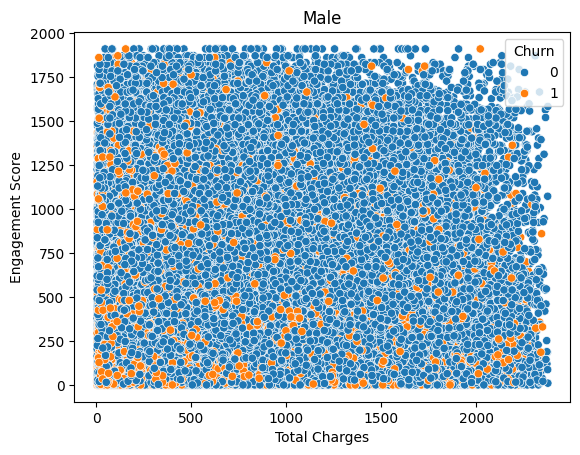

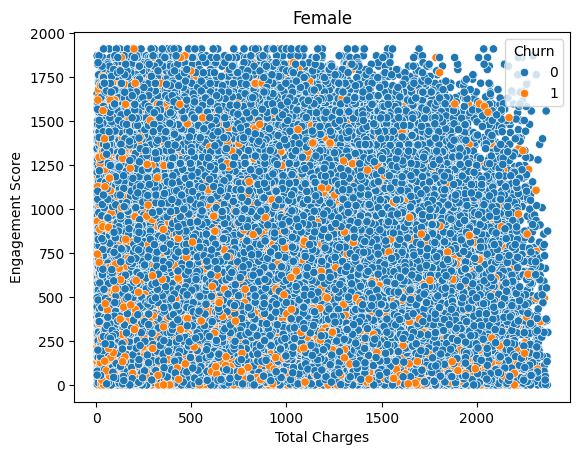

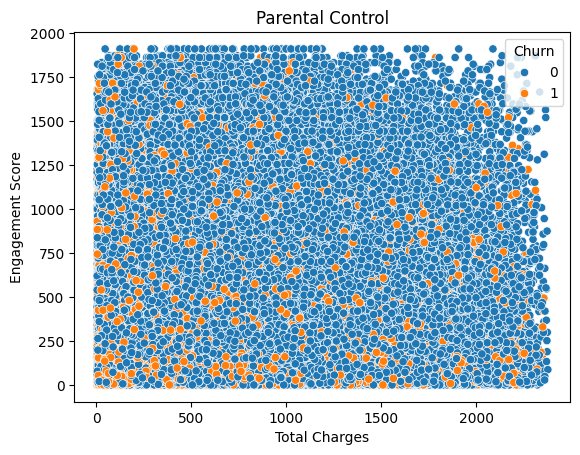

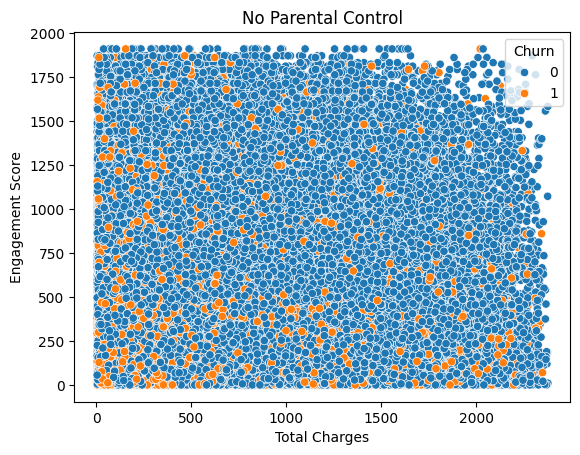

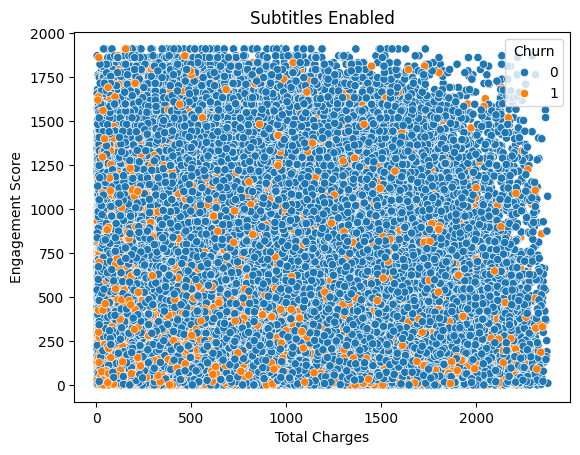

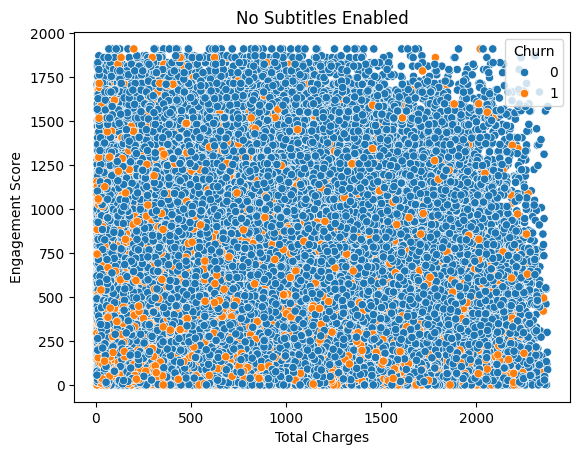

In [ ]:
for title, data in zip(titles, data_arrays):
  plt.figure()
  sns.scatterplot(x = data['TotalCharges'], y = data['EngagementScore'], hue = data['Churn'])
  plt.xlabel('Total Charges')
  plt.ylabel('Engagement Score')
  plt.title(title)
  plt.show

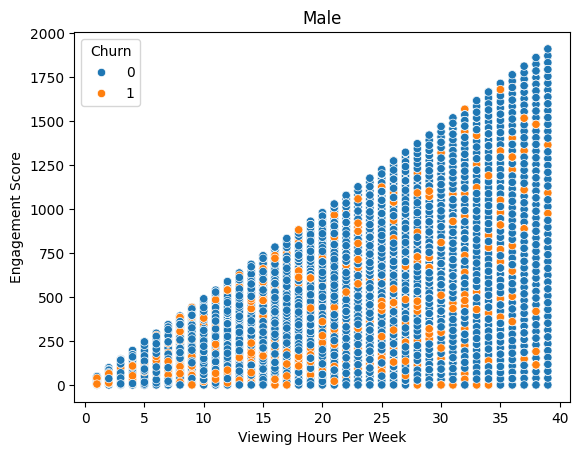

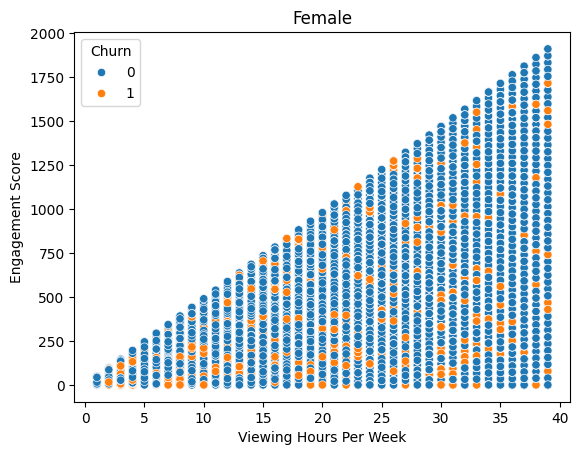

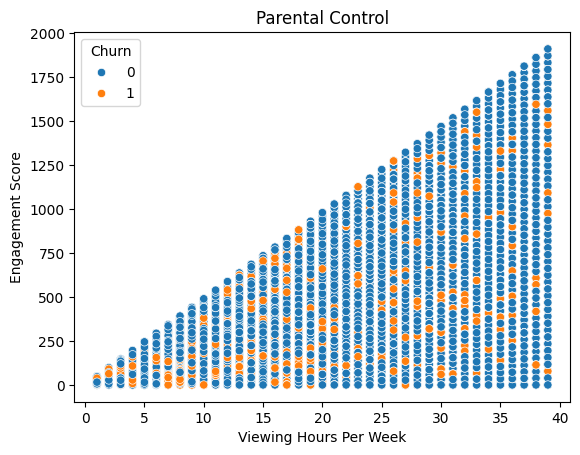

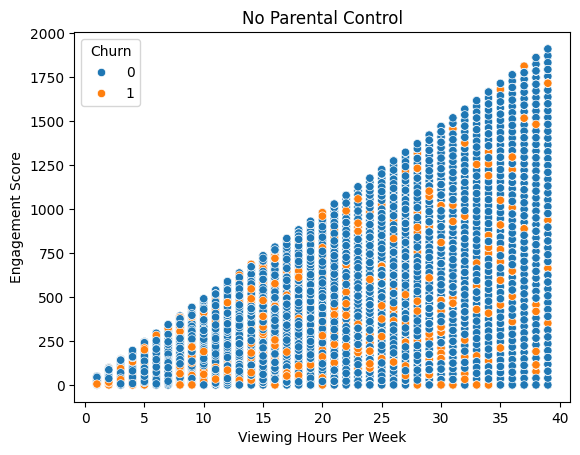

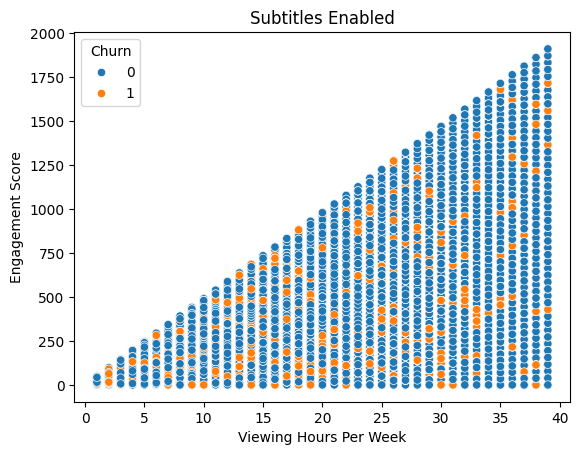

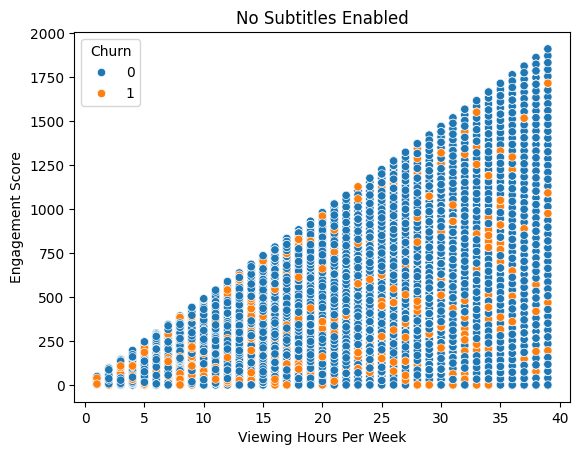

In [ ]:
for title, data in zip(titles, data_arrays):
  plt.figure()
  sns.scatterplot(x = data['ViewingHoursPerWeek'], y = data['EngagementScore'], hue = data['Churn'])
  plt.xlabel('Viewing Hours Per Week')
  plt.ylabel('Engagement Score')
  plt.title(title)
  plt.show

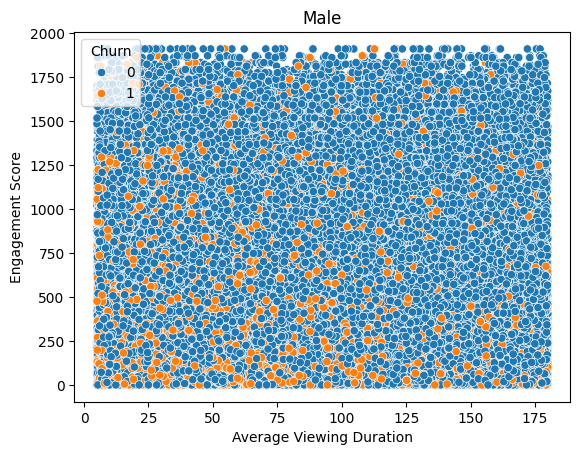

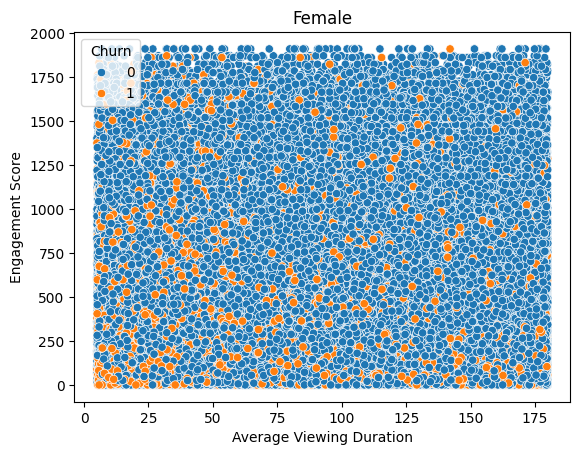

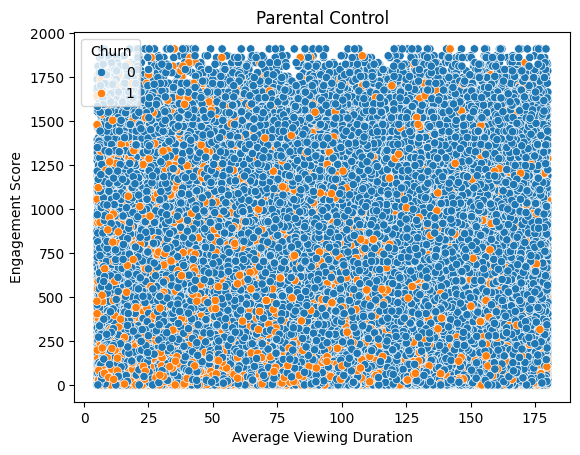

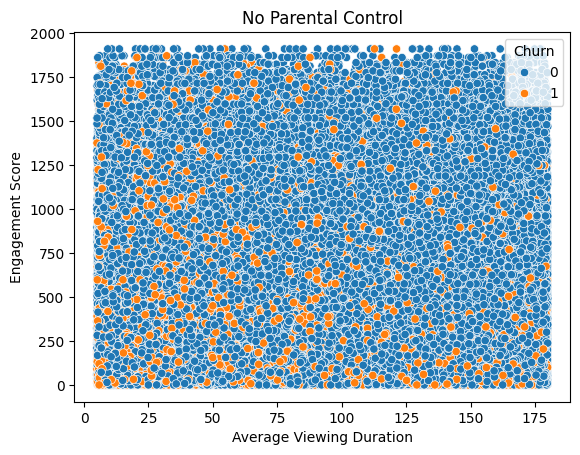

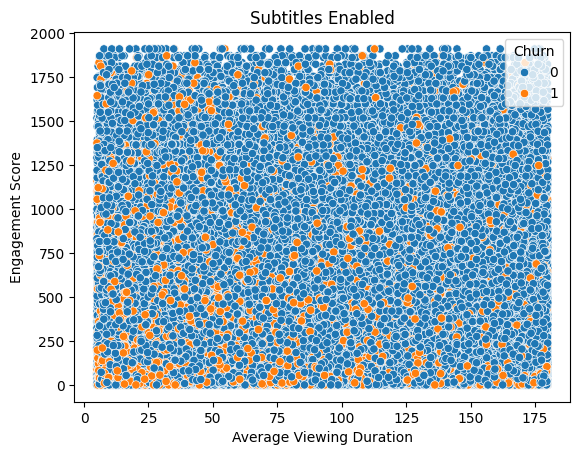

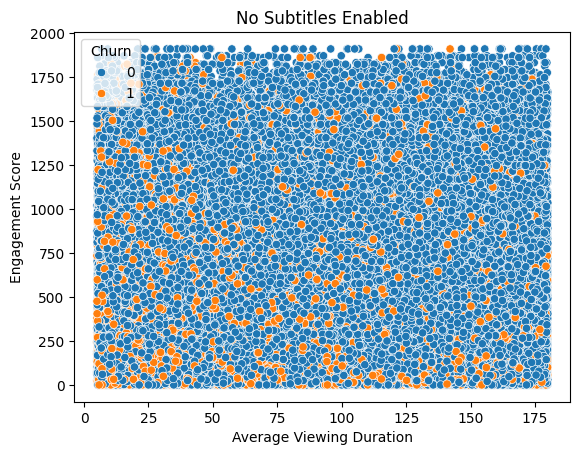

In [ ]:
for title, data in zip(titles, data_arrays):
  plt.figure()
  sns.scatterplot(x = data['AverageViewingDuration'], y = data['EngagementScore'], hue = data['Churn'])
  plt.xlabel('Average Viewing Duration')
  plt.ylabel('Engagement Score')
  plt.title(title)

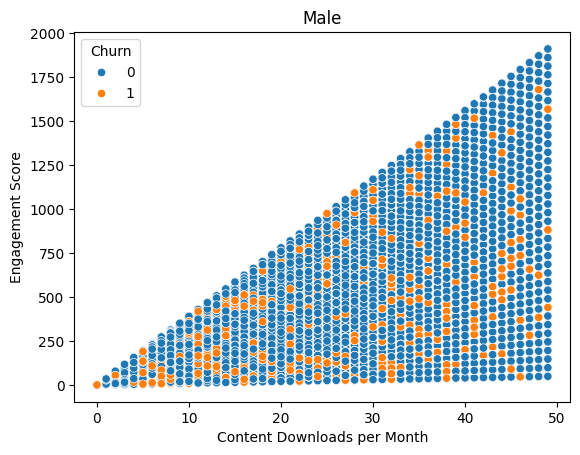

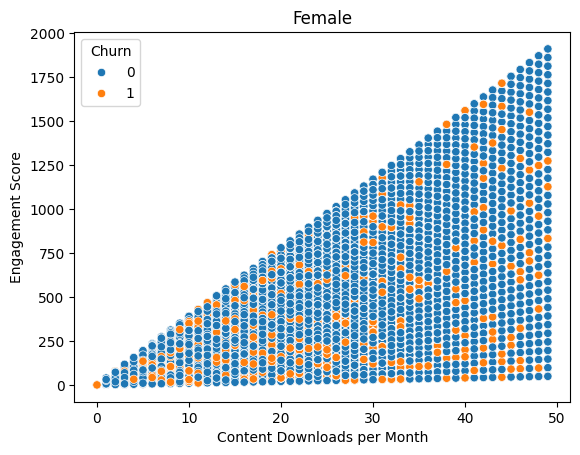

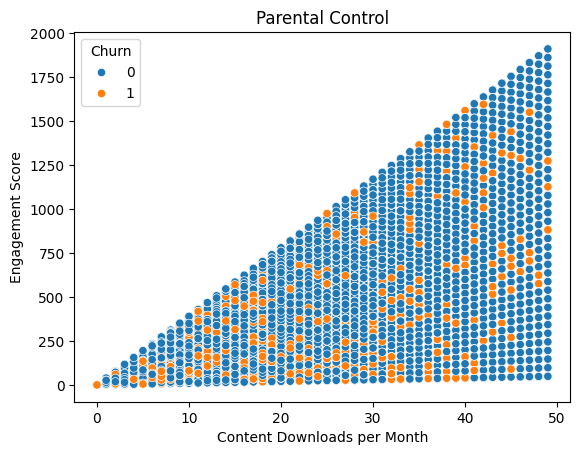

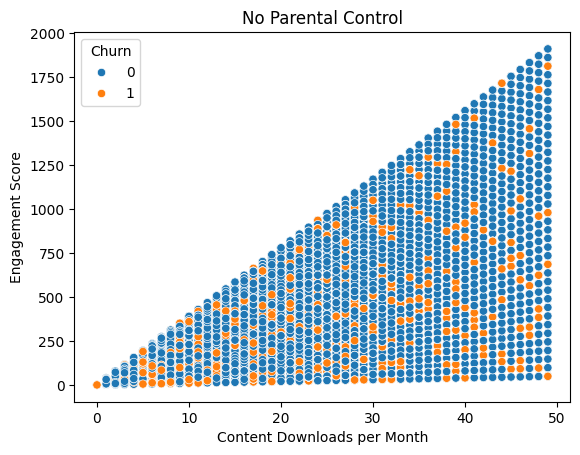

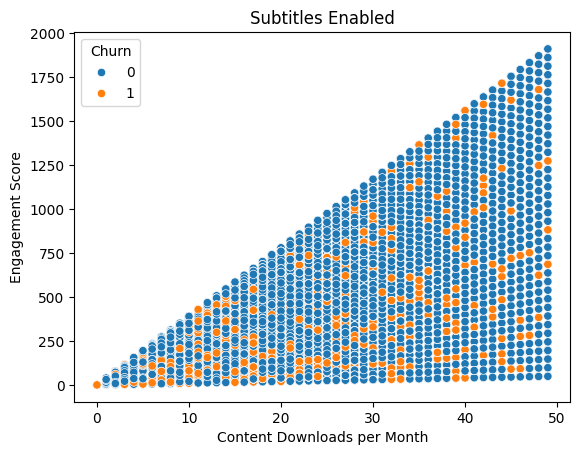

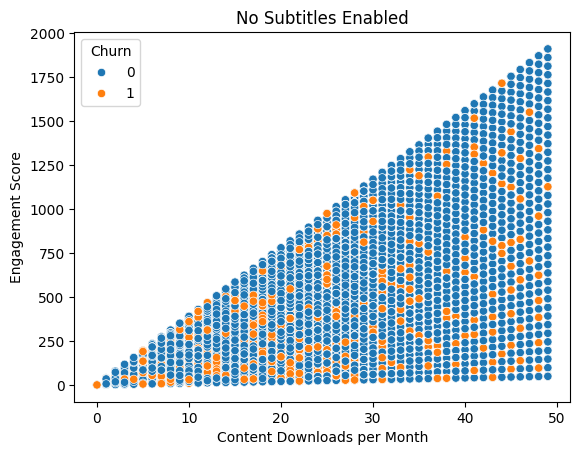

In [ ]:
for title, data in zip(titles, data_arrays):
  plt.figure()
  sns.scatterplot(x = data['ContentDownloadsPerMonth'], y = data['EngagementScore'], hue = data['Churn'])
  plt.xlabel('Content Downloads per Month')
  plt.ylabel('Engagement Score')
  plt.title(title)
  plt.show

Next Step: Applying Logistic Regression to see which features affect churn the greatest

Performing resampling based on those results
